- 🐶 Bark is a transformer-based text-to-audio model created by Suno. Bark can generate highly realistic, multilingual speech as well as other audio - including music, background noise and simple sound effects.
- TTS model is an AI model that converts text to natural sounding spoken text.
- Bark is a multilingual model. [Languages supported](https://github.com/suno-ai/bark/tree/main?tab=readme-ov-file#supported-languages)

In [ ]:
!nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2024 NVIDIA Corporation
Built on Thu_Jun__6_02:18:23_PDT_2024
Cuda compilation tools, release 12.5, V12.5.82
Build cuda_12.5.r12.5/compiler.34385749_0


In [ ]:
!nvidia-smi -L

GPU 0: Tesla T4 (UUID: GPU-94a460f7-8bd8-138f-5de8-8932fe78b3fd)


# Imports

In [ ]:
%%time

from IPython.display import clear_output

! pip install -U accelerate -qq # for inference time optimization (enable_cpu_offload)

clear_output()

CPU times: user 2.46 s, sys: 1.04 s, total: 3.5 s
Wall time: 1min 52s


In [ ]:
import warnings
warnings.filterwarnings('ignore')

import time
import gc
import re

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.io.wavfile import write # to save audios

### HF
from transformers import AutoProcessor, AutoModel

### torch
import torch
from torchaudio.transforms import Resample
import torchaudio

### audio
from IPython.display import Audio

In [ ]:
import transformers
print('transformers version: ', transformers.__version__)
print('torch version: ', torch.__version__)

transformers version:  4.52.4
torch version:  2.6.0+cu124


# CFG

- [Bark Speaker Library](https://suno-ai.notion.site/8b8e8749ed514b0cbf3f699013548683?v=bc67cff786b04b50b3ceb756fd05f68c). Choose your speaker and language from here.

In [ ]:
class CFG:
    DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

    ### processor
    SPEAKER = "v2/hi_speaker_1" # voice preset

    ### model
    MODEL_NAME = 'suno/bark'

    ### post-processing: to visualize and remove Noise
    AMPLITUDE_THRESHOLD = 0.05
    TIME_THRESHOLD = int(24_000 * 0.5) # sample_rate * n_seconds
    IGNORE_INITIAL_STEPS = int(24_000 * 0.5) # sample_rate * n_seconds

# 📝 Text

In [ ]:
### choose text to make inference on
text_to_infer = '''
भारत एक अत्यधिक जनसंख्या वाला देश है साथ ही प्राकृतिक रुप से सभी दिशाओं से सुरक्षित है. पूरे विश्व भर में अपनी महान संस्कृति और पारंपरिक मूल्यों के लिये ये एक प्रसिद्ध देश है. इसके पास हिमालय नाम का एक पर्वत है जो विश्व में सबसे ऊँचा है. ये तीन तरफ से तीन महासागरों से घिरा हुआ है जैसे दक्षिण में भारतीय महासागर, पूरब में बंगाल की खाड़ी और पश्चिम में अरेबिक सागर से. भारत एक लोकतांत्रिक देश है जो जनसंख्या के लिहाज से दूसरे स्थान पर है. भारत में मुख्य रूप से हिंदी भाषा बोली जाती है परंतु यहां लगभग 22 भाषाओं को राष्ट्रीय रुप से मान्यता दी गयी है.
भारत देश शिव, पार्वती, कृष्ण, हनुमान, बुद्ध, महात्मा गाँधी, स्वामी विवेकानंद और कबीर आदि जैसे महापुरुषों की धरती है.
'''

In [ ]:
len(text_to_infer)

666

# 🐶 Bark Model

- Instantiate [Processor](https://huggingface.co/docs/transformers/v4.36.1/en/model_doc/bark#transformers.BarkProcessor) and [Model](https://huggingface.co/docs/transformers/v4.36.1/en/model_doc/bark#transformers.BarkModel)
- Choose voice to be used: voice_preset parameter (CFG class)
- Use float16 for half-precision when instantiating the model. This loads the model in half-precision, reducing memory footprint by 50% and speeding up inference time
- To further reduce memory footprint and inference time, offload idle models to CPU with`model.enable_cpu_offload()` (needs accelerate library)

In [ ]:
%%time

processor = AutoProcessor.from_pretrained(
    CFG.MODEL_NAME,
    voice_preset = CFG.SPEAKER,
    return_tensors = 'pt'
)
model = AutoModel.from_pretrained(
    CFG.MODEL_NAME,
    torch_dtype = torch.float16, # half-precision
).to(CFG.DEVICE);

### inference optimization with accelerate
model.enable_cpu_offload()

clear_output()

CPU times: user 15.1 s, sys: 13.4 s, total: 28.5 s
Wall time: 1min 33s


In [ ]:
### bark architecture
model.eval()

BarkModel(
  (semantic): BarkSemanticModel(
    (input_embeds_layer): Embedding(129600, 1024)
    (position_embeds_layer): Embedding(1024, 1024)
    (drop): Dropout(p=0.0, inplace=False)
    (layers): ModuleList(
      (0-23): 24 x BarkBlock(
        (layernorm_1): BarkLayerNorm()
        (layernorm_2): BarkLayerNorm()
        (attn): BarkSelfAttention(
          (attn_dropout): Dropout(p=0.0, inplace=False)
          (resid_dropout): Dropout(p=0.0, inplace=False)
          (att_proj): Linear(in_features=1024, out_features=3072, bias=False)
          (out_proj): Linear(in_features=1024, out_features=1024, bias=False)
        )
        (mlp): BarkMLP(
          (in_proj): Linear(in_features=1024, out_features=4096, bias=False)
          (out_proj): Linear(in_features=4096, out_features=1024, bias=False)
          (dropout): Dropout(p=0.0, inplace=False)
          (gelu): GELU(approximate='none')
        )
      )
    )
    (layernorm_final): BarkLayerNorm()
    (lm_head): Linear(in_feat

In [ ]:
from torch.nn import Parameter

def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad) + \
           sum(p.numel() for p in model.parameters() if not p.requires_grad and isinstance(p, Parameter))

n_params = count_parameters(model)
n_params
### suno/bark: 1 B params
### suno/bark-small: 410 M params

1100590818

# Prepare input

- Bark 🐶 performs best when it is fed one sentence at a time.
- If we feed the processor with a text that has more than 2 sentences, there is a good chance that the model will get confused and speak an alien language.
- From the [documentation](https://github.com/suno-ai/bark/tree/main#-updates):

```
Why is the output limited to ~13-14 seconds? Bark is a GPT-style model, and its architecture/context window is optimized to output generations with roughly this length.
```

- So after inference, we will need to post-process some audios that were 'padded' to his length.

___


- We can feed many sentences at a time in a list, and the inference time is much better this way. But the output quality degrades a lot.
- Although slower, calling the processor and the model at each sentence is the best option to optimize for output quality.
- If we feed one sentence at a time we will also have minimum noise, if any, to post-process after inference, so this is a huge plus as well.

In [ ]:
def count_tokens(text, processor = processor):
    return len(processor.tokenizer(text)['input_ids'])

In [ ]:
total_tokens = count_tokens(text_to_infer, processor = processor)
total_tokens

222

In [ ]:
def split_sentences(text):
    '''
    Given a text, return a list of sentences.
    '''
    ### Split on '. ', '.\n', '.\n\n', '!', '?', and ';'
    sentences = re.split(r'\. |\.\n|\.\n\n|!|\?|;', text)

    ### Strip whitespace from each sentence
    sentences = [
        sentence.strip() + '..'
        for sentence in sentences
    ]

    ### Remove empty strings from the list of sentences
    sentences = list(filter(None, sentences))

    number_of_sentences = len(sentences)

    return sentences[:-1], number_of_sentences - 1

In [ ]:
### testing function
sentences, number_of_sentences = split_sentences(text = text_to_infer)
print(f'Sentences: \n {sentences}')
print(f'\n\nNumber of sentences: {number_of_sentences}')

Sentences: 
 ['भारत एक अत्यधिक जनसंख्या वाला देश है साथ ही प्राकृतिक रुप से सभी दिशाओं से सुरक्षित है..', 'पूरे विश्व भर में अपनी महान संस्कृति और पारंपरिक मूल्यों के लिये ये एक प्रसिद्ध देश है..', 'इसके पास हिमालय नाम का एक पर्वत है जो विश्व में सबसे ऊँचा है..', 'ये तीन तरफ से तीन महासागरों से घिरा हुआ है जैसे दक्षिण में भारतीय महासागर, पूरब में बंगाल की खाड़ी और पश्चिम में अरेबिक सागर से..', 'भारत एक लोकतांत्रिक देश है जो जनसंख्या के लिहाज से दूसरे स्थान पर है..', 'भारत में मुख्य रूप से हिंदी भाषा बोली जाती है परंतु यहां लगभग 22 भाषाओं को राष्ट्रीय रुप से मान्यता दी गयी है..', 'भारत देश शिव, पार्वती, कृष्ण, हनुमान, बुद्ध, महात्मा गाँधी, स्वामी विवेकानंद और कबीर आदि जैसे महापुरुषों की धरती है..']


Number of sentences: 7


# Inference

- For each sentence we want to visualize and analyse its wave together with its audio and text.
- We try to discover noise patterns that we can remove later.
- This will help understand how we can post-process the model predictions to improve quality.


Sentences in this text:
 ['भारत एक अत्यधिक जनसंख्या वाला देश है साथ ही प्राकृतिक रुप से सभी दिशाओं से सुरक्षित है..', 'पूरे विश्व भर में अपनी महान संस्कृति और पारंपरिक मूल्यों के लिये ये एक प्रसिद्ध देश है..', 'इसके पास हिमालय नाम का एक पर्वत है जो विश्व में सबसे ऊँचा है..', 'ये तीन तरफ से तीन महासागरों से घिरा हुआ है जैसे दक्षिण में भारतीय महासागर, पूरब में बंगाल की खाड़ी और पश्चिम में अरेबिक सागर से..', 'भारत एक लोकतांत्रिक देश है जो जनसंख्या के लिहाज से दूसरे स्थान पर है..', 'भारत में मुख्य रूप से हिंदी भाषा बोली जाती है परंतु यहां लगभग 22 भाषाओं को राष्ट्रीय रुप से मान्यता दी गयी है..', 'भारत देश शिव, पार्वती, कृष्ण, हनुमान, बुद्ध, महात्मा गाँधी, स्वामी विवेकानंद और कबीर आदि जैसे महापुरुषों की धरती है..']

Number of sentences in this text: 7

Processing sentence 1/7...


hi_speaker_1_semantic_prompt.npy:   0%|          | 0.00/2.63k [00:00<?, ?B/s]

hi_speaker_1_coarse_prompt.npy:   0%|          | 0.00/7.65k [00:00<?, ?B/s]

hi_speaker_1_fine_prompt.npy:   0%|          | 0.00/15.2k [00:00<?, ?B/s]


          Sentence 1/7 processed:
          	Number of tokens in sentence: 28
          	Length of sentence: 88
          	Number of sentences in text: 7
          	Shape of tensor for this sentence: torch.Size([1, 177920])
          	Elapsed time for this sentence: 37.03 s
          	Estimated time to complete: 3.7 min
          
भारत एक अत्यधिक जनसंख्या वाला देश है साथ ही प्राकृतिक रुप से सभी दिशाओं से सुरक्षित है..


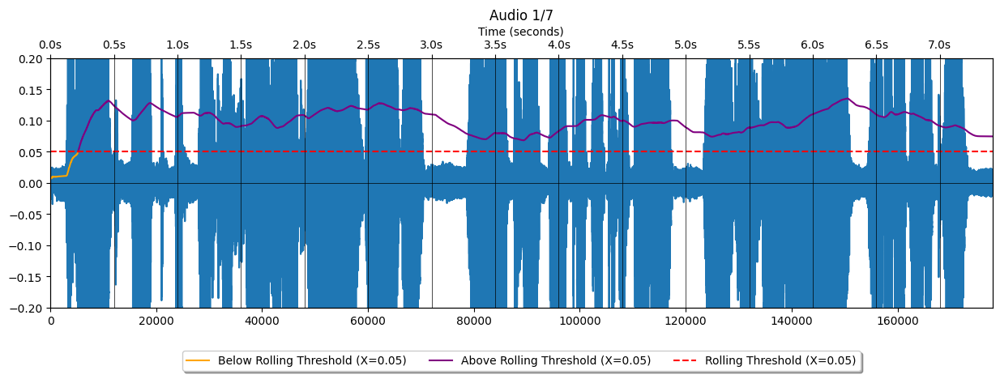

Processing sentence 2/7...

          Sentence 2/7 processed:
          	Number of tokens in sentence: 29
          	Length of sentence: 88
          	Number of sentences in text: 7
          	Shape of tensor for this sentence: torch.Size([1, 168320])
          	Elapsed time for this sentence: 35.28 s
          	Estimated time to complete: 3.01 min
          
पूरे विश्व भर में अपनी महान संस्कृति और पारंपरिक मूल्यों के लिये ये एक प्रसिद्ध देश है..


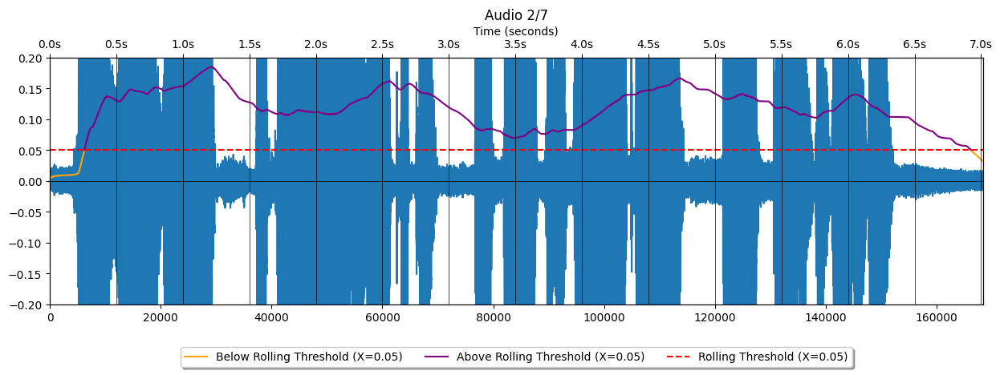

Processing sentence 3/7...

          Sentence 3/7 processed:
          	Number of tokens in sentence: 21
          	Length of sentence: 62
          	Number of sentences in text: 7
          	Shape of tensor for this sentence: torch.Size([1, 115200])
          	Elapsed time for this sentence: 25.39 s
          	Estimated time to complete: 2.17 min
          
इसके पास हिमालय नाम का एक पर्वत है जो विश्व में सबसे ऊँचा है..


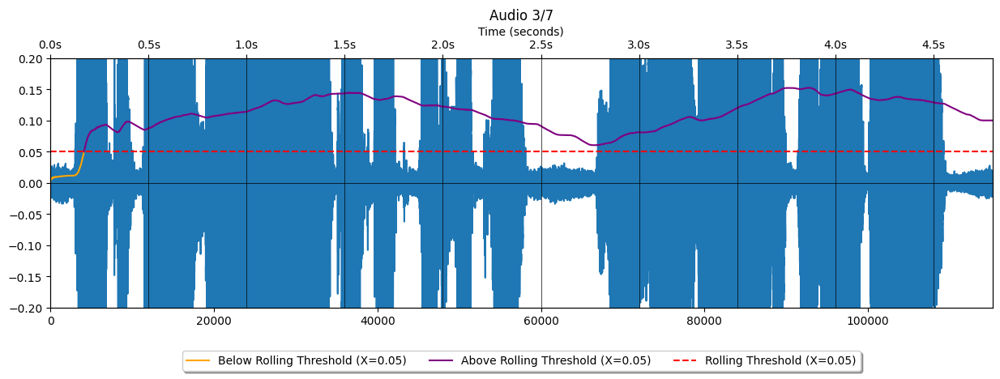

Processing sentence 4/7...

          Sentence 4/7 processed:
          	Number of tokens in sentence: 51
          	Length of sentence: 129
          	Number of sentences in text: 7
          	Shape of tensor for this sentence: torch.Size([1, 236800])
          	Elapsed time for this sentence: 47.53 s
          	Estimated time to complete: 1.82 min
          
ये तीन तरफ से तीन महासागरों से घिरा हुआ है जैसे दक्षिण में भारतीय महासागर, पूरब में बंगाल की खाड़ी और पश्चिम में अरेबिक सागर से..


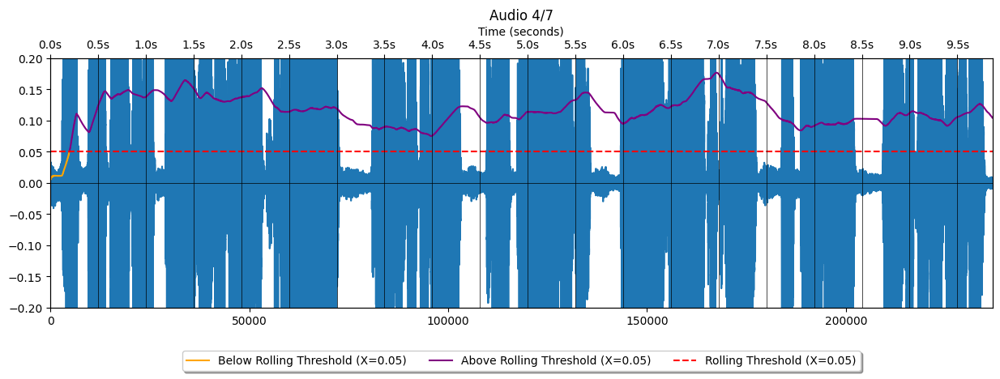

Processing sentence 5/7...

          Sentence 5/7 processed:
          	Number of tokens in sentence: 24
          	Length of sentence: 70
          	Number of sentences in text: 7
          	Shape of tensor for this sentence: torch.Size([1, 116160])
          	Elapsed time for this sentence: 23.31 s
          	Estimated time to complete: 1.12 min
          
भारत एक लोकतांत्रिक देश है जो जनसंख्या के लिहाज से दूसरे स्थान पर है..


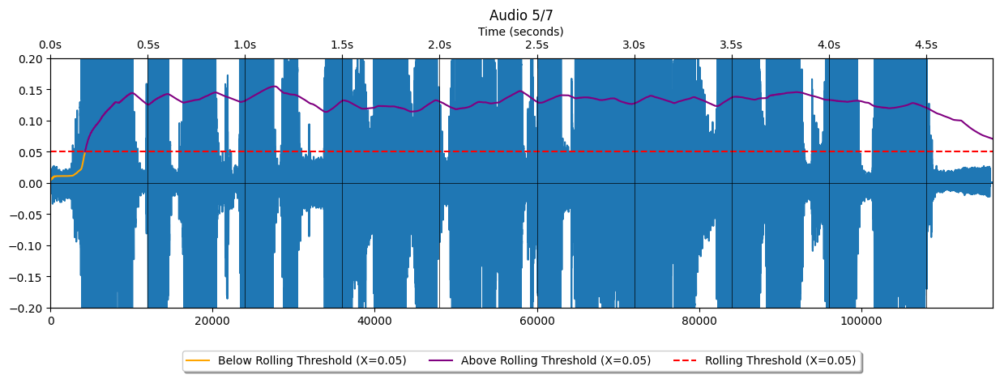

Processing sentence 6/7...

          Sentence 6/7 processed:
          	Number of tokens in sentence: 31
          	Length of sentence: 111
          	Number of sentences in text: 7
          	Shape of tensor for this sentence: torch.Size([1, 207040])
          	Elapsed time for this sentence: 40.65 s
          	Estimated time to complete: 0.58 min
          
भारत में मुख्य रूप से हिंदी भाषा बोली जाती है परंतु यहां लगभग 22 भाषाओं को राष्ट्रीय रुप से मान्यता दी गयी है..


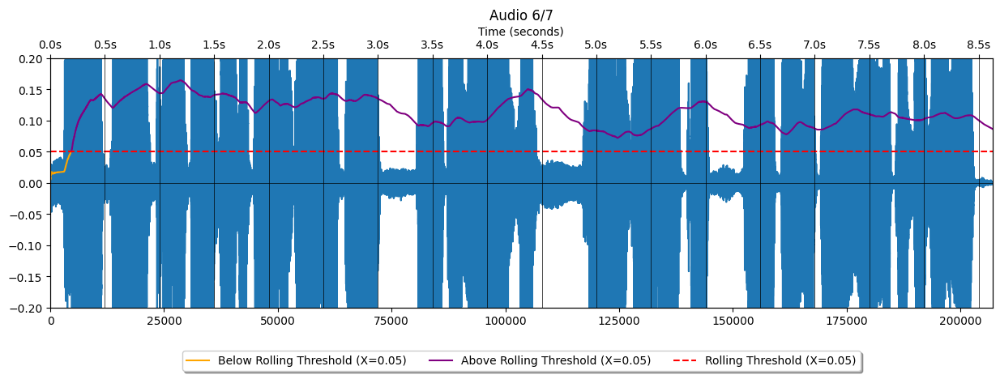

Processing sentence 7/7...

          Sentence 7/7 processed:
          	Number of tokens in sentence: 57
          	Length of sentence: 117
          	Number of sentences in text: 7
          	Shape of tensor for this sentence: torch.Size([1, 244160])
          	Elapsed time for this sentence: 69.13 s
          	Estimated time to complete: 0.0 min
          
भारत देश शिव, पार्वती, कृष्ण, हनुमान, बुद्ध, महात्मा गाँधी, स्वामी विवेकानंद और कबीर आदि जैसे महापुरुषों की धरती है..


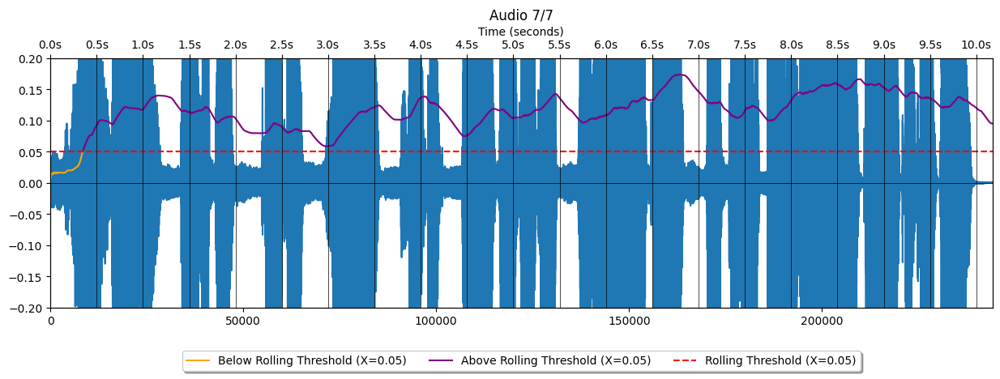

CPU times: user 4min 16s, sys: 6.89 s, total: 4min 23s
Wall time: 4min 45s


In [ ]:
%%time

### prepare list of sentences
sentences, number_of_sentences = split_sentences(text = text_to_infer)
print(f'\nSentences in this text:\n {sentences}')
print(f'\nNumber of sentences in this text: {number_of_sentences}\n')

all_audio_arrays = []
all_times = []

### inference per sentence
for sentence_number in range(number_of_sentences):

    current_sentence = sentences[sentence_number]

    print(f'Processing sentence {sentence_number + 1}/{number_of_sentences}...')

    start_time = time.time()

    ### prepare input for the model, call the processor for the current sentence only
    inputs = processor(
    text=current_sentence,
    return_tensors="pt",
    return_attention_mask=True,
    max_length=1024,
    voice_preset=CFG.SPEAKER,
    add_special_tokens=False,
  )

    # Move all tensors in inputs dict to CFG.DEVICE
    inputs = {k: v.to(CFG.DEVICE) for k, v in inputs.items()}


    ### count tokens
    n_tokens = count_tokens(current_sentence)

    ### model inference
    with torch.inference_mode():
        result = model.generate(
            **inputs,
            do_sample = True,
            semantic_max_new_tokens = 1024,
            pad_token_id = processor.tokenizer.pad_token_id,
        )

    ### save results
    all_audio_arrays.append(result.cpu().numpy())
    elapsed_time = round((time.time() - start_time), 2)
    all_times.append(elapsed_time)

    sentences_left_to_processs = number_of_sentences - (sentence_number + 1)
    average_time = np.array(all_times).mean()
    time_to_complete = round((sentences_left_to_processs * average_time)/60, 2) # in minutes

    print(f'''
          Sentence {sentence_number + 1}/{number_of_sentences} processed:
          \tNumber of tokens in sentence: {n_tokens}
          \tLength of sentence: {len(current_sentence)}
          \tNumber of sentences in text: {number_of_sentences}
          \tShape of tensor for this sentence: {result.size()}
          \tElapsed time for this sentence: {elapsed_time} s
          \tEstimated time to complete: {time_to_complete} min
          ''')

    sample_rate = model.generation_config.sample_rate # 24_000

    result_array = result.cpu().numpy()
    result_len = result_array.shape[-1]

    fig, ax1 = plt.subplots(figsize=(15,4))
    ax2 = ax1.twiny()
    print(current_sentence)

    ### plot audio array for this sentence
    values = result_array.ravel()
    display(Audio(data=values, rate=sample_rate))
    ax1.plot(values)

    ### calculate rolling amplitude Series
    rolling_window_size = sample_rate # 24_000
    rolling_amplitude = pd.Series(np.abs(values)).rolling(window=rolling_window_size, min_periods=1).mean()

    ### plot the rolling amplitude Series with colors based on the rolling amplitude threshold
    rolling_threshold = CFG.AMPLITUDE_THRESHOLD # 0.05
    ax1.plot(np.where(rolling_amplitude < rolling_threshold, rolling_amplitude, np.nan), color='orange', label=f'Below Rolling Threshold (X={rolling_threshold})')
    ax1.plot(np.where(rolling_amplitude >= rolling_threshold, rolling_amplitude, np.nan), color='purple', label=f'Above Rolling Threshold (X={rolling_threshold})')
    ax1.axhline(y=rolling_threshold, color='red', linestyle='--', label=f'Rolling Threshold (X={rolling_threshold})')

    ### plot auxiliary X axis with Time in seconds: half-second positions
    half_second_positions = np.arange(0, result_len, sample_rate // 2)
    ax2.set_xticks(half_second_positions)
    ax2.set_xticklabels([f'{t:.1f}s' for t in half_second_positions / sample_rate])
    ax2.set_xlabel('Time (seconds)')
    for position in half_second_positions:
        plt.axvline(x=position, color='black', linestyle='-', linewidth=0.5)

    ### plot design
    ax1.axhline(0, color='black', linestyle='-', linewidth=0.5)
    ax1.set_xlim(0, result_array.shape[-1])
    ax2.set_xlim(0, result_array.shape[-1])
    ax1.set_ylim(-0.20, 0.20)
    ax1.set_title(f'Audio {sentence_number+1}/{number_of_sentences}')
    ax1.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), fancybox=True, shadow=True, ncol=3)
    plt.show()

    del result
    gc.collect()

# Time

- Average processing time per sentence (in seconds)

In [ ]:
avg_time = np.array(all_times).mean().round(2) # average time per sentence (in seconds)
avg_time

np.float64(39.76)

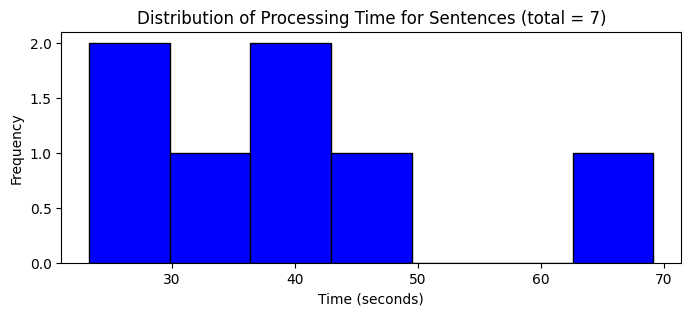

In [ ]:
plt.figure(figsize=(8,3))
plt.hist(all_times, bins=len(sentences), color='blue', edgecolor='black')
plt.title(f'Distribution of Processing Time for Sentences (total = {len(sentences)})')
plt.xlabel('Time (seconds)')
plt.ylabel('Frequency');

# ✂️ Slice array function


- Bark 🐶 sometimes barks something very weird at the end of the sentence.
- As stated in the [documentation](https://github.com/suno-ai/bark/tree/main#-updates):

```
Bark generates audio from scratch. It is not meant to create only high-fidelity, studio-quality speech. Rather, outputs could be anything from perfect speech to multiple people arguing at a baseball game recorded with bad microphones.
```

- So it is sometimes necessary to clean the audio (noise) that was added at the end of the file.
- To achieve this, we'll **segment the array using** a straightforward criterion that relies on the **amplitude values across consecutive time steps**. The visualizations and plots in the inference section can offer insights into strategies for audio cleaning.
- You can tune the parameters on CFG class (amplitude threshold, time steps, ignore steps).
- **This function attempts to remove the noise generated at the end of each audio.**

In [ ]:
def slice_array_wave(input_array, amplitude_threshold, time_threshold, ignore_initial_steps=0):
    """
    Slice an input array based on consecutive low amplitude values.

    Parameters:
    - input_array (numpy.ndarray): Input array containing amplitude values.
    - amplitude_threshold (float): Threshold below which amplitudes are considered low.
    - time_threshold (int): Number of consecutive low amplitude values needed to trigger slicing.
    - ignore_initial_steps (int, optional): Number of initial steps to ignore before checking for consecutive low amplitudes.

    Returns:
    numpy.ndarray: Sliced array up to the point where consecutive low amplitudes reach the specified time_threshold.
    """

    low_amplitude_indices = np.abs(input_array) < amplitude_threshold

    consecutive_count = 0
    for i, is_low_amplitude in enumerate(low_amplitude_indices[ignore_initial_steps:]):
        if is_low_amplitude:
            consecutive_count += 1
        else:
            consecutive_count = 0

        if consecutive_count >= time_threshold:
#             return input_array[:i - time_threshold]
#             return input_array[:i - int(time_threshold/2) + int(time_threshold/4)]
            return input_array[:i + int(time_threshold/4)]

    return input_array

# 🔊 Final Audio

- Slice waves
- Concatenate waves

In [ ]:
%%time
### Concatenate results for each batch
concatenated_array  = np.array([])

for audio_number, sentence_audio in enumerate(all_audio_arrays):

    print(f'Audio {audio_number + 1}/{len(all_audio_arrays)}')

    ### concat audio arrays
    current_array = all_audio_arrays[audio_number].squeeze()

    ### post-processed array (remove padding in inference was done in batches)
    current_array = slice_array_wave(
        input_array = current_array,
        amplitude_threshold = CFG.AMPLITUDE_THRESHOLD,
        time_threshold = CFG.TIME_THRESHOLD,
        ignore_initial_steps = CFG.IGNORE_INITIAL_STEPS
    )

    concatenated_array = np.concatenate([concatenated_array, current_array])

### display the concatenated audio
display(Audio(data=concatenated_array, rate=sample_rate)) # normal speed

### save as np.array
np.save(f'./final_audio_sr_{sample_rate}.npy', concatenated_array)

### save as .wav file
write(
    f'./final_audio_sr_{sample_rate}.wav',
    rate = sample_rate,
    data = concatenated_array
  )

Audio 1/7
Audio 2/7
Audio 3/7
Audio 4/7
Audio 5/7
Audio 6/7
Audio 7/7


CPU times: user 244 ms, sys: 21.1 ms, total: 265 ms
Wall time: 296 ms


In [ ]:
### checking if array was loaded succesfully
loaded_array = np.load('./final_audio_sr_24000.npy')
display(Audio(data=loaded_array, rate=sample_rate))

In [ ]:
sentences

['भारत एक अत्यधिक जनसंख्या वाला देश है साथ ही प्राकृतिक रुप से सभी दिशाओं से सुरक्षित है..',
 'पूरे विश्व भर में अपनी महान संस्कृति और पारंपरिक मूल्यों के लिये ये एक प्रसिद्ध देश है..',
 'इसके पास हिमालय नाम का एक पर्वत है जो विश्व में सबसे ऊँचा है..',
 'ये तीन तरफ से तीन महासागरों से घिरा हुआ है जैसे दक्षिण में भारतीय महासागर, पूरब में बंगाल की खाड़ी और पश्चिम में अरेबिक सागर से..',
 'भारत एक लोकतांत्रिक देश है जो जनसंख्या के लिहाज से दूसरे स्थान पर है..',
 'भारत में मुख्य रूप से हिंदी भाषा बोली जाती है परंतु यहां लगभग 22 भाषाओं को राष्ट्रीय रुप से मान्यता दी गयी है..',
 'भारत देश शिव, पार्वती, कृष्ण, हनुमान, बुद्ध, महात्मा गाँधी, स्वामी विवेकानंद और कबीर आदि जैसे महापुरुषों की धरती है..']

In [ ]:
text_to_infer

'\nभारत एक अत्यधिक जनसंख्या वाला देश है साथ ही प्राकृतिक रुप से सभी दिशाओं से सुरक्षित है. पूरे विश्व भर में अपनी महान संस्कृति और पारंपरिक मूल्यों के लिये ये एक प्रसिद्ध देश है. इसके पास हिमालय नाम का एक पर्वत है जो विश्व में सबसे ऊँचा है. ये तीन तरफ से तीन महासागरों से घिरा हुआ है जैसे दक्षिण में भारतीय महासागर, पूरब में बंगाल की खाड़ी और पश्चिम में अरेबिक सागर से. भारत एक लोकतांत्रिक देश है जो जनसंख्या के लिहाज से दूसरे स्थान पर है. भारत में मुख्य रूप से हिंदी भाषा बोली जाती है परंतु यहां लगभग 22 भाषाओं को राष्ट्रीय रुप से मान्यता दी गयी है.\nभारत देश शिव, पार्वती, कृष्ण, हनुमान, बुद्ध, महात्मा गाँधी, स्वामी विवेकानंद और कबीर आदि जैसे महापुरुषों की धरती है.\n'

# Conclusion

- Bark is an amazing model, but a but unpredictable sometimes
- Overall, I think it has very good output quality
- Inference doesn't scale well for large texts, since we must feed ~13s of audio at a time
- Even for short texts the inference is very slow when compared to other TTS models like Facebook MMS (which is much faster but has worse output quality in my opinion)
- Using Bark still involves a lot of post-processing in the output, but I imagine this will get better soon
- **<font color='orange'>Upvote if you liked it!</font>** 🐶